In [0]:
!pip install -q findspark

In [0]:
# Create a Spark session for use in this project

import findspark
try:
    if(spark == None):
        spark = SparkSession.builder.appName('Abhi_Big_Data').getOrCreate()
        sqlContext=SQLContext(spark)
except NameError:
    spark = SparkSession.builder.appName('Abhi_Big_Data').getOrCreate()
    sqlContext=SQLContext(spark)

In [0]:
# Check the spark version installed and used for this project

import pyspark
print(pyspark.__version__)

2.4.6.dev0

In [0]:
# Install other libaries to be used in this notebook
##%%capture
!apt install libkrb5-dev
!pip install sparkmagic
!pip install pyspark
!pip install pyspark --user
!apt update
!apt install gcc python-dev libkrb5-dev

In [0]:
# Include all the required libraries to be used in this project

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go

#misc
import gc
import time
import warnings

#import heapq  # for getting top n number of things from list,dict
import pandas as pd
import numpy as np

# JSON parsing
import json

# SQLite RDBMS
import sqlite3

# Time conversions
import time

import pyspark
from pyspark.sql import SQLContext

from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql.functions import col, lit, udf
import pyspark.sql.functions as F
from pyspark.sql.types import IntegerType
import os
from pyspark.sql.functions import monotonically_increasing_id, row_number
from pyspark.sql.window import Window
from datetime import datetime

Import error while trying to switch matplotlib backend:
cannot import name 'secure_write' from 'jupyter_core.paths' (/databricks/python/lib/python3.7/site-packages/jupyter_core/paths.py)
Setting matplotlib backend to inline requires ipykernel and matplotlib dependencies.
See https://docs.databricks.com/libraries.html for details.

In [0]:
#%load_ext sparkmagic.magics

In [0]:
# Read Johns Hopkins time series dataset for confirmed cases in CSV format
global_confirmed_sdf = (sqlContext.read.format("csv").
  option("header", "true").
  option("nullValue", "NA").
  option("inferSchema", True).
  load("/FileStore/tables/time_series_covid19_confirmed_global-1.csv"))

In [0]:
# Read Johns Hopkins time series dataset for deaths in CSV format
global_deaths_sdf = (sqlContext.read.format("csv").
  option("header", "true").
  option("nullValue", "NA").
  option("inferSchema", True).
  load("/FileStore/tables/time_series_covid19_deaths_global-1.csv"))

In [0]:
# Read Johns Hopkins time series dataset for recovered cases in CSV format
global_recovered_sdf = (sqlContext.read.format("csv").
  option("header", "true").
  option("nullValue", "NA").
  option("inferSchema", True).
  load("/FileStore/tables/time_series_covid19_recovered_global-1.csv"))

In [0]:
# Display confirmed cases in spark dataframe
display(global_confirmed_sdf)

Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
null,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,2,4,4,4,4,5,7,8,11,12,13,15,16,18,20,24,25,29,30,34,41,43,76,80,91,107,118,146,175,197,240,275,300,338,368,424,445,485,532,556,608,666,715,785,841,907,934,997,1027,1093,1177,1236,1331,1464,1532,1704,1830,1940,2127,2291,2470,2705,2895,3225,3393,3564,3781,4042,4403,4687,4968,5227,5640,6054,6403,6665,7073,7654,8146,8677,9219,10001,10585,11176,11834,12459,13039,13662,14528,15208,15753,16512,17270,18057,18972,19554,20345,20920,21462,22146,22894,23550,24106,24770,25531,26314,26878,27536,27882,28428,28837,29147,29471,29705,30165,30441,30606,30957,31228,31507,31826,32012,32314,32662,32941,33180,33374,33584,33

In [0]:
# Display deaths in spark dataframe
display(global_deaths_sdf)

Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
null,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,2,3,3,4,4,4,4,4,4,8,10,12,15,16,16,17,18,18,19,22,23,29,30,30,30,33,36,36,40,40,43,47,52,58,59,61,64,68,72,85,90,95,104,106,109,115,120,122,127,132,136,153,168,170,173,178,188,194,206,217,219,220,221,228,236,247,250,258,266,274,298,304,313,331,361,373,388,409,430,450,455,475,482,495,508,550,552,573,585,597,617,638,674,682,716,728,740,752,780,809,821,828,866,900,922,939,959,973,996,1012,1040,1064,1096,1117,1149,1166,1183,1185,1188,1192,1213,1227,1249,1261,1271,1272,1273,1283,1284,1285,1286,1290,1290,1296,1301,1310,1315,1321,1329,1346,1356,1365,1370,1371,1376,

In [0]:
# Display recovered cases in spark dataframe
display(global_recovered_sdf)

Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
null,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,5,5,10,10,10,15,18,18,29,32,32,32,32,32,40,43,54,99,112,131,135,150,166,179,188,188,207,220,228,252,260,310,331,345,397,421,458,468,472,502,558,558,610,648,691,745,745,778,801,850,930,938,996,1040,1075,1097,1128,1138,1209,1259,1303,1328,1428,1450,1522,1585,1762,1830,1875,2171,2651,3013,3326,3928,4201,4725,5164,5508,6158,7660,7962,8292,8764,8841,9260,9869,10174,10306,10674,12604,13934,14131,15651,16041,17331,19164,19366,20103,20179,20700,20847,20882,21135,21216,21254,21454,22456,22824,23151,23273,23634,23741,23741,23924,24550,24602,24793,25180,251

In [0]:
# Confirmed cases
# Drop unwanted columns from spark dataframe and rename the column Country/Region as Country
global_confirmed_sdf_shrt = global_confirmed_sdf.drop('Province/State','Lat','Long')
global_confirmed_sdf_shrt = global_confirmed_sdf_shrt.withColumnRenamed('Country/Region','Country')
display(global_confirmed_sdf_shrt)

Country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,2,4,4,4,4,5,7,8,11,12,13,15,16,18,20,24,25,29,30,34,41,43,76,80,91,107,118,146,175,197,240,275,300,338,368,424,445,485,532,556,608,666,715,785,841,907,934,997,1027,1093,1177,1236,1331,1464,1532,1704,1830,1940,2127,2291,2470,2705,2895,3225,3393,3564,3781,4042,4403,4687,4968,5227,5640,6054,6403,6665,7073,7654,8146,8677,9219,10001,10585,11176,11834,12459,13039,13662,14528,15208,15753,16512,17270,18057,18972,19554,20345,20920,21462,22146,22894,23550,24106,24770,25531,26314,26878,27536,27882,28428,28837,29147,29471,29705,30165,30441,30606,30957,31228,31507,31826,32012,32314,32662,32941,33180,33374,33584,33898,34184,34356,34441,34595,34730,34984,35060,35219,352

In [0]:
# Deaths dataset
# Drop unwanted columns from spark dataframe and rename the column Country/Region as Country
global_deaths_sdf_shrt = global_deaths_sdf.drop('Province/State','Lat','Long')
global_deaths_sdf_shrt = global_deaths_sdf_shrt.withColumnRenamed('Country/Region','Country')
display(global_deaths_sdf_shrt)

Country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,2,3,3,4,4,4,4,4,4,8,10,12,15,16,16,17,18,18,19,22,23,29,30,30,30,33,36,36,40,40,43,47,52,58,59,61,64,68,72,85,90,95,104,106,109,115,120,122,127,132,136,153,168,170,173,178,188,194,206,217,219,220,221,228,236,247,250,258,266,274,298,304,313,331,361,373,388,409,430,450,455,475,482,495,508,550,552,573,585,597,617,638,674,682,716,728,740,752,780,809,821,828,866,900,922,939,959,973,996,1012,1040,1064,1096,1117,1149,1166,1183,1185,1188,1192,1213,1227,1249,1261,1271,1272,1273,1283,1284,1285,1286,1290,1290,1296,1301,1310,1315,1321,1329,1346,1356,1365,1370,1371,1376,1378,1382,1384,1386,1386,1386,1388,1390,1398,1402,1402,

In [0]:
# Recovered cases
# Drop unwanted columns from spark dataframe and rename the column Country/Region as Country
global_recovered_sdf_shrt = global_recovered_sdf.drop('Province/State','Lat','Long')
global_recovered_sdf_shrt = global_recovered_sdf_shrt.withColumnRenamed('Country/Region','Country')
display(global_recovered_sdf_shrt)

Country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,5,5,10,10,10,15,18,18,29,32,32,32,32,32,40,43,54,99,112,131,135,150,166,179,188,188,207,220,228,252,260,310,331,345,397,421,458,468,472,502,558,558,610,648,691,745,745,778,801,850,930,938,996,1040,1075,1097,1128,1138,1209,1259,1303,1328,1428,1450,1522,1585,1762,1830,1875,2171,2651,3013,3326,3928,4201,4725,5164,5508,6158,7660,7962,8292,8764,8841,9260,9869,10174,10306,10674,12604,13934,14131,15651,16041,17331,19164,19366,20103,20179,20700,20847,20882,21135,21216,21254,21454,22456,22824,23151,23273,23634,23741,23741,23924,24550,24602,24793,25180,25198,25358,25389,25471,25509,25509,25510,25669,25669,2574

In [0]:
# Display confirmed cases for a single country. This is to validate the total numbers in later stages
display(global_confirmed_sdf_shrt.filter(global_confirmed_sdf_shrt.Country.isin('Australia')))

Country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20,9/24/20,9/25/20,9/26/20,9/27/20,9/28/20,9/29/20,9/30/20,10/1/20,10/2/20,10/3/20,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,12/21/20,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21,1/11/21,1/12/21,1/13/21,1/14/21,1/15/21,1/16/21,1/17/21,1/18/21,1/19/21,1/20/21,1/21/21,1/22/21,1/23/21,1/24/21,1/25/21,1/26/21,1/27/21,1/28/21,1/29/21,1/30/21,1/31/21,2/1/21,2/2/21,2/3/21,2/4/21,2/5/21,2/6/21,2/7/21,2/8/21,2/9/21,2/10/21,2/11/21,2/12/21,2/13/21,2/14/21,2/15/21,2/16/21,2/17/21,2/18/21,2/19/21,2/20/21,2/21/21,2/22/21,2/23/21,2/24/21,2/25/21,2/26/21,2/27/21,2/28/21,3/1/21,3/2/21,3/3/21,3/4/21
Australia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,2,2,3,4,6,9,19,32,39,39,53,62,71,77,78,80,84,87,91,93,96,96,96,99,100,103,103,103,102,103,103,103,103,103,103,104,104,104,104,105,106,106,106,106,106,106,106,106,106,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,107,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,108,111,112,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,113,1

In [0]:
# Create a date list of the respective datasets
col_list = global_confirmed_sdf.columns
Date_list = col_list[4:]
conf_df = spark.createDataFrame(Date_list,StringType()).toDF("Date")
conf_df.take(5)

Out[17]: [Row(Date='1/22/20'),
 Row(Date='1/23/20'),
 Row(Date='1/24/20'),
 Row(Date='1/25/20'),
 Row(Date='1/26/20')]

In [0]:
conf_df.count()

Out[18]: 408

In [0]:
# Create a date list of the respective datasets
col_deaths_list = global_deaths_sdf.columns
Date_deaths_list = col_deaths_list[4:]
deaths_df = spark.createDataFrame(Date_deaths_list,StringType()).toDF("Date")
deaths_df.take(5)

Out[19]: [Row(Date='1/22/20'),
 Row(Date='1/23/20'),
 Row(Date='1/24/20'),
 Row(Date='1/25/20'),
 Row(Date='1/26/20')]

In [0]:
# Create a date list of the respective datasets
col_recovered_list = global_recovered_sdf.columns
Date_recovered_list = col_recovered_list[4:]
recovered_df = spark.createDataFrame(Date_recovered_list,StringType()).toDF("Date")
recovered_df.take(5)

Out[20]: [Row(Date='1/22/20'),
 Row(Date='1/23/20'),
 Row(Date='1/24/20'),
 Row(Date='1/25/20'),
 Row(Date='1/26/20')]

In [0]:
# Here we are counting total number of confirmed cases for each country on a particular date
global_confirmed_sdf_1 = global_confirmed_sdf_shrt.groupBy("Country").sum()
display(global_confirmed_sdf_1.take(5))

Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),sum(3/1/20),sum(3/2/20),sum(3/3/20),sum(3/4/20),sum(3/5/20),sum(3/6/20),sum(3/7/20),sum(3/8/20),sum(3/9/20),sum(3/10/20),sum(3/11/20),sum(3/12/20),sum(3/13/20),sum(3/14/20),sum(3/15/20),sum(3/16/20),sum(3/17/20),sum(3/18/20),sum(3/19/20),sum(3/20/20),sum(3/21/20),sum(3/22/20),sum(3/23/20),sum(3/24/20),sum(3/25/20),sum(3/26/20),sum(3/27/20),sum(3/28/20),sum(3/29/20),sum(3/30/20),sum(3/31/20),sum(4/1/20),sum(4/2/20),sum(4/3/20),sum(4/4/20),sum(4/5/20),sum(4/6/20),sum(4/7/20),sum(4/8/20),sum(4/9/20),sum(4/10/20),sum(4/11/20),sum(4/12/20),sum(4/13/20),sum(4/14/20),sum(4/15/20),sum(4/16/20),sum(4/17/20),sum(4/18/20),sum(4/19/20),sum(4/20/20),sum(4/21/20),sum(4/22/20),sum(4/23/20),sum(4/24/20),sum(4/25/20),sum(4/26/20),sum(4/27/20),sum(4/28/20),sum(4/29/20),sum(4/30/20),sum(5/1/20),sum(5/2/20),sum(5/3/20),sum(5/4/20),sum(5/5/20),sum(5/6/20),sum(5/7/20),sum(5/8/20),sum(5/9/20),sum(5/10/20),sum(5/11/20),sum(5/12/20),sum(5/13/20),sum(5/14/20),sum(5/15/20),sum(5/16/20),sum(5/17/20),sum(5/18/20),sum(5/19/20),sum(5/20/20),sum(5/21/20),sum(5/22/20),sum(5/23/20),sum(5/24/20),sum(5/25/20),sum(5/26/20),sum(5/27/20),sum(5/28/20),sum(5/29/20),sum(5/30/20),sum(5/31/20),sum(6/1/20),sum(6/2/20),sum(6/3/20),sum(6/4/20),sum(6/5/20),sum(6/6/20),sum(6/7/20),sum(6/8/20),sum(6/9/20),sum(6/10/20),sum(6/11/20),sum(6/12/20),sum(6/13/20),sum(6/14/20),sum(6/15/20),sum(6/16/20),sum(6/17/20),sum(6/18/20),sum(6/19/20),sum(6/20/20),sum(6/21/20),sum(6/22/20),sum(6/23/20),sum(6/24/20),sum(6/25/20),sum(6/26/20),sum(6/27/20),sum(6/28/20),sum(6/29/20),sum(6/30/20),sum(7/1/20),sum(7/2/20),sum(7/3/20),sum(7/4/20),sum(7/5/20),sum(7/6/20),sum(7/7/20),sum(7/8/20),sum(7/9/20),sum(7/10/20),sum(7/11/20),sum(7/12/20),sum(7/13/20),sum(7/14/20),sum(7/15/20),sum(7/16/20),sum(7/17/20),sum(7/18/20),sum(7/19/20),sum(7/20/20),sum(7/21/20),sum(7/22/20),sum(7/23/20),sum(7/24/20),sum(7/25/20),sum(7/26/20),sum(7/27/20),sum(7/28/20),sum(7/29/20),sum(7/30/20),sum(7/31/20),sum(8/1/20),sum(8/2/20),sum(8/3/20),sum(8/4/20),sum(8/5/20),sum(8/6/20),sum(8/7/20),sum(8/8/20),sum(8/9/20),sum(8/10/20),sum(8/11/20),sum(8/12/20),sum(8/13/20),sum(8/14/20),sum(8/15/20),sum(8/16/20),sum(8/17/20),sum(8/18/20),sum(8/19/20),sum(8/20/20),sum(8/21/20),sum(8/22/20),sum(8/23/20),sum(8/24/20),sum(8/25/20),sum(8/26/20),sum(8/27/20),sum(8/28/20),sum(8/29/20),sum(8/30/20),sum(8/31/20),sum(9/1/20),sum(9/2/20),sum(9/3/20),sum(9/4/20),sum(9/5/20),sum(9/6/20),sum(9/7/20),sum(9/8/20),sum(9/9/20),sum(9/10/20),sum(9/11/20),sum(9/12/20),sum(9/13/20),sum(9/14/20),sum(9/15/20),sum(9/16/20),sum(9/17/20),sum(9/18/20),sum(9/19/20),sum(9/20/20),sum(9/21/20),sum(9/22/20),sum(9/23/20),sum(9/24/20),sum(9/25/20),sum(9/26/20),sum(9/27/20),sum(9/28/20),sum(9/29/20),sum(9/30/20),sum(10/1/20),sum(10/2/20),sum(10/3/20),sum(10/4/20),sum(10/5/20),sum(10/6/20),sum(10/7/20),sum(10/8/20),sum(10/9/20),sum(10/10/20),sum(10/11/20),sum(10/12/20),sum(10/13/20),sum(10/14/20),sum(10/15/20),sum(10/16/20),sum(10/17/20),sum(10/18/20),sum(10/19/20),sum(10/20/20),sum(10/21/20),sum(10/22/20),sum(10/23/20),sum(10/24/20),sum(10/25/20),sum(10/26/20),sum(10/27/20),sum(10/28/20),sum(10/29/20),sum(10/30/20),sum(10/31/20),sum(11/1/20),sum(11/2/20),sum(11/3/20),sum(11/4/20),sum(11/5/20),sum(11/6/20),sum(11/7/20),sum(11/8/20),sum(11/9/20),sum(11/10/20),sum(11/11/20),sum(11/12/20),sum(11/13/20),sum(11/14/20),sum(11/15/20),sum(11/16/20),sum(11/17/20),sum(11/18/20),sum(11/19/20),sum(11/20/20),sum(11/21/20),sum(11/22/20),sum(11/23/20),sum(11/24/20),sum(11/25/20),sum(11/26

In [0]:
# Here we are counting total number of deaths for each country on a particular date
global_deaths_sdf_1 = global_deaths_sdf_shrt.groupBy("Country").sum()
display(global_deaths_sdf_1.take(5))

Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),sum(3/1/20),sum(3/2/20),sum(3/3/20),sum(3/4/20),sum(3/5/20),sum(3/6/20),sum(3/7/20),sum(3/8/20),sum(3/9/20),sum(3/10/20),sum(3/11/20),sum(3/12/20),sum(3/13/20),sum(3/14/20),sum(3/15/20),sum(3/16/20),sum(3/17/20),sum(3/18/20),sum(3/19/20),sum(3/20/20),sum(3/21/20),sum(3/22/20),sum(3/23/20),sum(3/24/20),sum(3/25/20),sum(3/26/20),sum(3/27/20),sum(3/28/20),sum(3/29/20),sum(3/30/20),sum(3/31/20),sum(4/1/20),sum(4/2/20),sum(4/3/20),sum(4/4/20),sum(4/5/20),sum(4/6/20),sum(4/7/20),sum(4/8/20),sum(4/9/20),sum(4/10/20),sum(4/11/20),sum(4/12/20),sum(4/13/20),sum(4/14/20),sum(4/15/20),sum(4/16/20),sum(4/17/20),sum(4/18/20),sum(4/19/20),sum(4/20/20),sum(4/21/20),sum(4/22/20),sum(4/23/20),sum(4/24/20),sum(4/25/20),sum(4/26/20),sum(4/27/20),sum(4/28/20),sum(4/29/20),sum(4/30/20),sum(5/1/20),sum(5/2/20),sum(5/3/20),sum(5/4/20),sum(5/5/20),sum(5/6/20),sum(5/7/20),sum(5/8/20),sum(5/9/20),sum(5/10/20),sum(5/11/20),sum(5/12/20),sum(5/13/20),sum(5/14/20),sum(5/15/20),sum(5/16/20),sum(5/17/20),sum(5/18/20),sum(5/19/20),sum(5/20/20),sum(5/21/20),sum(5/22/20),sum(5/23/20),sum(5/24/20),sum(5/25/20),sum(5/26/20),sum(5/27/20),sum(5/28/20),sum(5/29/20),sum(5/30/20),sum(5/31/20),sum(6/1/20),sum(6/2/20),sum(6/3/20),sum(6/4/20),sum(6/5/20),sum(6/6/20),sum(6/7/20),sum(6/8/20),sum(6/9/20),sum(6/10/20),sum(6/11/20),sum(6/12/20),sum(6/13/20),sum(6/14/20),sum(6/15/20),sum(6/16/20),sum(6/17/20),sum(6/18/20),sum(6/19/20),sum(6/20/20),sum(6/21/20),sum(6/22/20),sum(6/23/20),sum(6/24/20),sum(6/25/20),sum(6/26/20),sum(6/27/20),sum(6/28/20),sum(6/29/20),sum(6/30/20),sum(7/1/20),sum(7/2/20),sum(7/3/20),sum(7/4/20),sum(7/5/20),sum(7/6/20),sum(7/7/20),sum(7/8/20),sum(7/9/20),sum(7/10/20),sum(7/11/20),sum(7/12/20),sum(7/13/20),sum(7/14/20),sum(7/15/20),sum(7/16/20),sum(7/17/20),sum(7/18/20),sum(7/19/20),sum(7/20/20),sum(7/21/20),sum(7/22/20),sum(7/23/20),sum(7/24/20),sum(7/25/20),sum(7/26/20),sum(7/27/20),sum(7/28/20),sum(7/29/20),sum(7/30/20),sum(7/31/20),sum(8/1/20),sum(8/2/20),sum(8/3/20),sum(8/4/20),sum(8/5/20),sum(8/6/20),sum(8/7/20),sum(8/8/20),sum(8/9/20),sum(8/10/20),sum(8/11/20),sum(8/12/20),sum(8/13/20),sum(8/14/20),sum(8/15/20),sum(8/16/20),sum(8/17/20),sum(8/18/20),sum(8/19/20),sum(8/20/20),sum(8/21/20),sum(8/22/20),sum(8/23/20),sum(8/24/20),sum(8/25/20),sum(8/26/20),sum(8/27/20),sum(8/28/20),sum(8/29/20),sum(8/30/20),sum(8/31/20),sum(9/1/20),sum(9/2/20),sum(9/3/20),sum(9/4/20),sum(9/5/20),sum(9/6/20),sum(9/7/20),sum(9/8/20),sum(9/9/20),sum(9/10/20),sum(9/11/20),sum(9/12/20),sum(9/13/20),sum(9/14/20),sum(9/15/20),sum(9/16/20),sum(9/17/20),sum(9/18/20),sum(9/19/20),sum(9/20/20),sum(9/21/20),sum(9/22/20),sum(9/23/20),sum(9/24/20),sum(9/25/20),sum(9/26/20),sum(9/27/20),sum(9/28/20),sum(9/29/20),sum(9/30/20),sum(10/1/20),sum(10/2/20),sum(10/3/20),sum(10/4/20),sum(10/5/20),sum(10/6/20),sum(10/7/20),sum(10/8/20),sum(10/9/20),sum(10/10/20),sum(10/11/20),sum(10/12/20),sum(10/13/20),sum(10/14/20),sum(10/15/20),sum(10/16/20),sum(10/17/20),sum(10/18/20),sum(10/19/20),sum(10/20/20),sum(10/21/20),sum(10/22/20),sum(10/23/20),sum(10/24/20),sum(10/25/20),sum(10/26/20),sum(10/27/20),sum(10/28/20),sum(10/29/20),sum(10/30/20),sum(10/31/20),sum(11/1/20),sum(11/2/20),sum(11/3/20),sum(11/4/20),sum(11/5/20),sum(11/6/20),sum(11/7/20),sum(11/8/20),sum(11/9/20),sum(11/10/20),sum(11/11/20),sum(11/12/20),sum(11/13/20),sum(11/14/20),sum(11/15/20),sum(11/16/20),sum(11/17/20),sum(11/18/20),sum(11/19/20),sum(11/20/20),sum(11/21/20),sum(11/22/20),sum(11/23/20),sum(11/24/20),sum(11/25/20),sum(11/26

In [0]:
# Here we are counting total number of recovered cases for each country on a particular date
global_recovered_sdf_1 = global_recovered_sdf_shrt.groupBy("Country").sum()
display(global_recovered_sdf_1.take(5))

Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),sum(3/1/20),sum(3/2/20),sum(3/3/20),sum(3/4/20),sum(3/5/20),sum(3/6/20),sum(3/7/20),sum(3/8/20),sum(3/9/20),sum(3/10/20),sum(3/11/20),sum(3/12/20),sum(3/13/20),sum(3/14/20),sum(3/15/20),sum(3/16/20),sum(3/17/20),sum(3/18/20),sum(3/19/20),sum(3/20/20),sum(3/21/20),sum(3/22/20),sum(3/23/20),sum(3/24/20),sum(3/25/20),sum(3/26/20),sum(3/27/20),sum(3/28/20),sum(3/29/20),sum(3/30/20),sum(3/31/20),sum(4/1/20),sum(4/2/20),sum(4/3/20),sum(4/4/20),sum(4/5/20),sum(4/6/20),sum(4/7/20),sum(4/8/20),sum(4/9/20),sum(4/10/20),sum(4/11/20),sum(4/12/20),sum(4/13/20),sum(4/14/20),sum(4/15/20),sum(4/16/20),sum(4/17/20),sum(4/18/20),sum(4/19/20),sum(4/20/20),sum(4/21/20),sum(4/22/20),sum(4/23/20),sum(4/24/20),sum(4/25/20),sum(4/26/20),sum(4/27/20),sum(4/28/20),sum(4/29/20),sum(4/30/20),sum(5/1/20),sum(5/2/20),sum(5/3/20),sum(5/4/20),sum(5/5/20),sum(5/6/20),sum(5/7/20),sum(5/8/20),sum(5/9/20),sum(5/10/20),sum(5/11/20),sum(5/12/20),sum(5/13/20),sum(5/14/20),sum(5/15/20),sum(5/16/20),sum(5/17/20),sum(5/18/20),sum(5/19/20),sum(5/20/20),sum(5/21/20),sum(5/22/20),sum(5/23/20),sum(5/24/20),sum(5/25/20),sum(5/26/20),sum(5/27/20),sum(5/28/20),sum(5/29/20),sum(5/30/20),sum(5/31/20),sum(6/1/20),sum(6/2/20),sum(6/3/20),sum(6/4/20),sum(6/5/20),sum(6/6/20),sum(6/7/20),sum(6/8/20),sum(6/9/20),sum(6/10/20),sum(6/11/20),sum(6/12/20),sum(6/13/20),sum(6/14/20),sum(6/15/20),sum(6/16/20),sum(6/17/20),sum(6/18/20),sum(6/19/20),sum(6/20/20),sum(6/21/20),sum(6/22/20),sum(6/23/20),sum(6/24/20),sum(6/25/20),sum(6/26/20),sum(6/27/20),sum(6/28/20),sum(6/29/20),sum(6/30/20),sum(7/1/20),sum(7/2/20),sum(7/3/20),sum(7/4/20),sum(7/5/20),sum(7/6/20),sum(7/7/20),sum(7/8/20),sum(7/9/20),sum(7/10/20),sum(7/11/20),sum(7/12/20),sum(7/13/20),sum(7/14/20),sum(7/15/20),sum(7/16/20),sum(7/17/20),sum(7/18/20),sum(7/19/20),sum(7/20/20),sum(7/21/20),sum(7/22/20),sum(7/23/20),sum(7/24/20),sum(7/25/20),sum(7/26/20),sum(7/27/20),sum(7/28/20),sum(7/29/20),sum(7/30/20),sum(7/31/20),sum(8/1/20),sum(8/2/20),sum(8/3/20),sum(8/4/20),sum(8/5/20),sum(8/6/20),sum(8/7/20),sum(8/8/20),sum(8/9/20),sum(8/10/20),sum(8/11/20),sum(8/12/20),sum(8/13/20),sum(8/14/20),sum(8/15/20),sum(8/16/20),sum(8/17/20),sum(8/18/20),sum(8/19/20),sum(8/20/20),sum(8/21/20),sum(8/22/20),sum(8/23/20),sum(8/24/20),sum(8/25/20),sum(8/26/20),sum(8/27/20),sum(8/28/20),sum(8/29/20),sum(8/30/20),sum(8/31/20),sum(9/1/20),sum(9/2/20),sum(9/3/20),sum(9/4/20),sum(9/5/20),sum(9/6/20),sum(9/7/20),sum(9/8/20),sum(9/9/20),sum(9/10/20),sum(9/11/20),sum(9/12/20),sum(9/13/20),sum(9/14/20),sum(9/15/20),sum(9/16/20),sum(9/17/20),sum(9/18/20),sum(9/19/20),sum(9/20/20),sum(9/21/20),sum(9/22/20),sum(9/23/20),sum(9/24/20),sum(9/25/20),sum(9/26/20),sum(9/27/20),sum(9/28/20),sum(9/29/20),sum(9/30/20),sum(10/1/20),sum(10/2/20),sum(10/3/20),sum(10/4/20),sum(10/5/20),sum(10/6/20),sum(10/7/20),sum(10/8/20),sum(10/9/20),sum(10/10/20),sum(10/11/20),sum(10/12/20),sum(10/13/20),sum(10/14/20),sum(10/15/20),sum(10/16/20),sum(10/17/20),sum(10/18/20),sum(10/19/20),sum(10/20/20),sum(10/21/20),sum(10/22/20),sum(10/23/20),sum(10/24/20),sum(10/25/20),sum(10/26/20),sum(10/27/20),sum(10/28/20),sum(10/29/20),sum(10/30/20),sum(10/31/20),sum(11/1/20),sum(11/2/20),sum(11/3/20),sum(11/4/20),sum(11/5/20),sum(11/6/20),sum(11/7/20),sum(11/8/20),sum(11/9/20),sum(11/10/20),sum(11/11/20),sum(11/12/20),sum(11/13/20),sum(11/14/20),sum(11/15/20),sum(11/16/20),sum(11/17/20),sum(11/18/20),sum(11/19/20),sum(11/20/20),sum(11/21/20),sum(11/22/20),sum(11/23/20),sum(11/24/20),sum(11/25/20),sum(11/26

In [0]:
# Validating the sum for a partucular country on one of the datasets
display(global_confirmed_sdf_1.filter(global_confirmed_sdf_1.Country.isin('Australia')))

Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),sum(3/1/20),sum(3/2/20),sum(3/3/20),sum(3/4/20),sum(3/5/20),sum(3/6/20),sum(3/7/20),sum(3/8/20),sum(3/9/20),sum(3/10/20),sum(3/11/20),sum(3/12/20),sum(3/13/20),sum(3/14/20),sum(3/15/20),sum(3/16/20),sum(3/17/20),sum(3/18/20),sum(3/19/20),sum(3/20/20),sum(3/21/20),sum(3/22/20),sum(3/23/20),sum(3/24/20),sum(3/25/20),sum(3/26/20),sum(3/27/20),sum(3/28/20),sum(3/29/20),sum(3/30/20),sum(3/31/20),sum(4/1/20),sum(4/2/20),sum(4/3/20),sum(4/4/20),sum(4/5/20),sum(4/6/20),sum(4/7/20),sum(4/8/20),sum(4/9/20),sum(4/10/20),sum(4/11/20),sum(4/12/20),sum(4/13/20),sum(4/14/20),sum(4/15/20),sum(4/16/20),sum(4/17/20),sum(4/18/20),sum(4/19/20),sum(4/20/20),sum(4/21/20),sum(4/22/20),sum(4/23/20),sum(4/24/20),sum(4/25/20),sum(4/26/20),sum(4/27/20),sum(4/28/20),sum(4/29/20),sum(4/30/20),sum(5/1/20),sum(5/2/20),sum(5/3/20),sum(5/4/20),sum(5/5/20),sum(5/6/20),sum(5/7/20),sum(5/8/20),sum(5/9/20),sum(5/10/20),sum(5/11/20),sum(5/12/20),sum(5/13/20),sum(5/14/20),sum(5/15/20),sum(5/16/20),sum(5/17/20),sum(5/18/20),sum(5/19/20),sum(5/20/20),sum(5/21/20),sum(5/22/20),sum(5/23/20),sum(5/24/20),sum(5/25/20),sum(5/26/20),sum(5/27/20),sum(5/28/20),sum(5/29/20),sum(5/30/20),sum(5/31/20),sum(6/1/20),sum(6/2/20),sum(6/3/20),sum(6/4/20),sum(6/5/20),sum(6/6/20),sum(6/7/20),sum(6/8/20),sum(6/9/20),sum(6/10/20),sum(6/11/20),sum(6/12/20),sum(6/13/20),sum(6/14/20),sum(6/15/20),sum(6/16/20),sum(6/17/20),sum(6/18/20),sum(6/19/20),sum(6/20/20),sum(6/21/20),sum(6/22/20),sum(6/23/20),sum(6/24/20),sum(6/25/20),sum(6/26/20),sum(6/27/20),sum(6/28/20),sum(6/29/20),sum(6/30/20),sum(7/1/20),sum(7/2/20),sum(7/3/20),sum(7/4/20),sum(7/5/20),sum(7/6/20),sum(7/7/20),sum(7/8/20),sum(7/9/20),sum(7/10/20),sum(7/11/20),sum(7/12/20),sum(7/13/20),sum(7/14/20),sum(7/15/20),sum(7/16/20),sum(7/17/20),sum(7/18/20),sum(7/19/20),sum(7/20/20),sum(7/21/20),sum(7/22/20),sum(7/23/20),sum(7/24/20),sum(7/25/20),sum(7/26/20),sum(7/27/20),sum(7/28/20),sum(7/29/20),sum(7/30/20),sum(7/31/20),sum(8/1/20),sum(8/2/20),sum(8/3/20),sum(8/4/20),sum(8/5/20),sum(8/6/20),sum(8/7/20),sum(8/8/20),sum(8/9/20),sum(8/10/20),sum(8/11/20),sum(8/12/20),sum(8/13/20),sum(8/14/20),sum(8/15/20),sum(8/16/20),sum(8/17/20),sum(8/18/20),sum(8/19/20),sum(8/20/20),sum(8/21/20),sum(8/22/20),sum(8/23/20),sum(8/24/20),sum(8/25/20),sum(8/26/20),sum(8/27/20),sum(8/28/20),sum(8/29/20),sum(8/30/20),sum(8/31/20),sum(9/1/20),sum(9/2/20),sum(9/3/20),sum(9/4/20),sum(9/5/20),sum(9/6/20),sum(9/7/20),sum(9/8/20),sum(9/9/20),sum(9/10/20),sum(9/11/20),sum(9/12/20),sum(9/13/20),sum(9/14/20),sum(9/15/20),sum(9/16/20),sum(9/17/20),sum(9/18/20),sum(9/19/20),sum(9/20/20),sum(9/21/20),sum(9/22/20),sum(9/23/20),sum(9/24/20),sum(9/25/20),sum(9/26/20),sum(9/27/20),sum(9/28/20),sum(9/29/20),sum(9/30/20),sum(10/1/20),sum(10/2/20),sum(10/3/20),sum(10/4/20),sum(10/5/20),sum(10/6/20),sum(10/7/20),sum(10/8/20),sum(10/9/20),sum(10/10/20),sum(10/11/20),sum(10/12/20),sum(10/13/20),sum(10/14/20),sum(10/15/20),sum(10/16/20),sum(10/17/20),sum(10/18/20),sum(10/19/20),sum(10/20/20),sum(10/21/20),sum(10/22/20),sum(10/23/20),sum(10/24/20),sum(10/25/20),sum(10/26/20),sum(10/27/20),sum(10/28/20),sum(10/29/20),sum(10/30/20),sum(10/31/20),sum(11/1/20),sum(11/2/20),sum(11/3/20),sum(11/4/20),sum(11/5/20),sum(11/6/20),sum(11/7/20),sum(11/8/20),sum(11/9/20),sum(11/10/20),sum(11/11/20),sum(11/12/20),sum(11/13/20),sum(11/14/20),sum(11/15/20),sum(11/16/20),sum(11/17/20),sum(11/18/20),sum(11/19/20),sum(11/20/20),sum(11/21/20),sum(11/22/20),sum(11/23/20),sum(11/24/20),sum(11/25/20),sum(11/26

In [0]:
# Transposing the dataset to get the dates in one column
global_confirmed_sdf_2 = global_confirmed_sdf_1.toPandas().transpose().reset_index().rename(columns={'index':'Date_Column'})
global_confirmed_sdf_2.head()

,Date_Column,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191
0,Country,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
1,sum(1/22/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,sum(1/23/20),0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
3,sum(1/24/20),0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
4,sum(1/25/20),0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0


In [0]:
# Slicing the new columns
global_confirmed_sdf_2.iloc[0:1]

,Date_Column,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191
0,Country,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands


In [0]:
# Slicing the list of all countries from the dataset
country_list = global_confirmed_sdf_2.iloc[0].tolist()

In [0]:
# Changing the spark dataframe to pandas for transposing
global_confirmed_sdf_3 = global_confirmed_sdf_1.toPandas()
global_confirmed_sdf_3.head()

,Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),...,sum(1/24/21),sum(1/25/21),sum(1/26/21),sum(1/27/21),sum(1/28/21),sum(1/29/21),sum(1/30/21),sum(1/31/21),sum(2/1/21),sum(2/2/21),sum(2/3/21),sum(2/4/21),sum(2/5/21),sum(2/6/21),sum(2/7/21),sum(2/8/21),sum(2/9/21),sum(2/10/21),sum(2/11/21),sum(2/12/21),sum(2/13/21),sum(2/14/21),sum(2/15/21),sum(2/16/21),sum(2/17/21),sum(2/18/21),sum(2/19/21),sum(2/20/21),sum(2/21/21),sum(2/22/21),sum(2/23/21),sum(2/24/21),sum(2/25/21),sum(2/26/21),sum(2/27/21),sum(2/28/21),sum(3/1/21),sum(3/2/21),sum(3/3/21),sum(3/4/21)
0,Chad,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3161,3182,3225,3269,3296,3321,3347,3376,3385,3404,3419,3433,3450,3473,3497,3508,3539,3568,3581,3597,3622,3645,3664,3689,3724,3751,3776,3794,3849,3868,3882,3904,3934,3957,3973,3973,3986,3999,4056,4089
1,Paraguay,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,127652,128366,129394,130163,130917,131886,132548,133227,133781,134482,135229,136023,136890,137603,138118,138945,139819,140797,141775,142598,143443,144042,145095,146216,147253,148622,149684,150731,151718,152658,153790,154904,156189,157603,158537,159474,160448,161530,162871,164310
2,Russia,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,...,3679247,3698246,3716228,3733692,3752548,3771514,3790265,3808348,3825739,3842145,3858367,3874830,3891274,3907653,3923461,3939162,3953970,3968228,3983031,3997898,4012538,4026506,4040505,4053535,4066164,4079407,4092649,4105424,4117992,4130447,4142126,4153735,4164802,4175757,4187166,4198400,4209850,4220291,4230707,4241970
3,Yemen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2118,2118,2119,2120,2120,2120,2120,2121,2122,2122,2122,2122,2124,2127,2127,2131,2131,2133,2134,2136,2136,2145,2145,2148,2151,2154,2157,2157,2165,2176,2187,2221,2255,2267,2269,2285,2310,2342,2363,2375
4,Senegal,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,24727,24993,25127,25407,25711,25895,26213,26523,26927,27080,27365,27733,28106,28489,28760,29057,29245,29521,29914,30376,30641,31007,31275,31476,31771,32099,32378,32630,32927,33099,33242,33453,33741,34031,34255,34520,34732,34832,35037,35247


In [0]:
len(global_confirmed_sdf_3)

Out[29]: 192

In [0]:
# Transposing the summed dataframe so that we can have counties in the column
global_confirmed_sdf_4 = pd.DataFrame(global_confirmed_sdf_3.values[:,1:].T, columns=country_list[1:])
global_confirmed_sdf_4.head()

,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,4,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0


In [0]:
# Checking few initial values for a specific country
global_confirmed_sdf_4['Australia'].head()

Out[31]: 0 0
1 0
2 0
3 0
4 4
Name: Australia, dtype: object

In [0]:
# Converting the pandas datafrem back to spark dataframe
global_confirmed_sdf_5 = spark.createDataFrame(global_confirmed_sdf_4)
display(global_confirmed_sdf_5.take(5))

Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,548,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,643,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,920,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2075,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0


In [0]:
# Transposing the dataset to get the dates in one column
global_deaths_sdf_2 = global_deaths_sdf_1.toPandas().transpose().reset_index().rename(columns={'index':'Date_Column'})
global_deaths_sdf_2.head()

,Date_Column,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191
0,Country,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
1,sum(1/22/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,sum(1/23/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,sum(1/24/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,sum(1/25/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Slicing the new columns
deaths_country_list = global_deaths_sdf_2.iloc[0].tolist()
global_deaths_sdf_3 = global_deaths_sdf_1.toPandas()
global_deaths_sdf_3.head()

,Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),...,sum(1/24/21),sum(1/25/21),sum(1/26/21),sum(1/27/21),sum(1/28/21),sum(1/29/21),sum(1/30/21),sum(1/31/21),sum(2/1/21),sum(2/2/21),sum(2/3/21),sum(2/4/21),sum(2/5/21),sum(2/6/21),sum(2/7/21),sum(2/8/21),sum(2/9/21),sum(2/10/21),sum(2/11/21),sum(2/12/21),sum(2/13/21),sum(2/14/21),sum(2/15/21),sum(2/16/21),sum(2/17/21),sum(2/18/21),sum(2/19/21),sum(2/20/21),sum(2/21/21),sum(2/22/21),sum(2/23/21),sum(2/24/21),sum(2/25/21),sum(2/26/21),sum(2/27/21),sum(2/28/21),sum(3/1/21),sum(3/2/21),sum(3/3/21),sum(3/4/21)
0,Chad,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,116,116,116,117,118,118,118,118,121,121,121,121,124,125,125,125,125,126,126,128,128,129,131,131,132,132,132,133,134,135,136,136,137,138,140,140,140,140,140,140
1,Paraguay,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2617,2632,2651,2668,2681,2693,2704,2718,2733,2750,2765,2779,2791,2807,2826,2846,2862,2876,2891,2904,2920,2936,2953,2971,2991,3008,3026,3045,3065,3080,3101,3119,3135,3152,3167,3181,3198,3218,3239,3256
2,Russia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,68397,68841,69391,69971,70533,71054,71556,72029,72456,72982,73497,74005,74520,75010,75430,75828,76347,76873,77415,77911,78403,78825,79210,79659,80118,80587,81048,81517,81926,82255,82666,83044,83481,83900,84330,84700,85025,85458,85901,86368
3,Yemen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,615,615,615,615,615,615,615,615,615,615,615,615,615,615,615,615,615,616,616,616,616,617,617,618,618,618,618,618,619,619,620,624,625,627,631,634,634,640,643,645
4,Senegal,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,575,582,592,601,614,617,621,628,638,641,648,659,666,675,682,689,700,712,724,735,741,748,754,760,769,781,787,795,808,814,832,840,852,857,866,872,880,888,896,898


In [0]:
# Transposing the summed dataframe so that we can have counties in the column
global_deaths_sdf_4 = pd.DataFrame(global_deaths_sdf_3.values[:,1:].T, columns=deaths_country_list[1:])
global_deaths_sdf_4.head()

,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Converting the pandas datafrem back to spark dataframe
global_deaths_sdf_5 = spark.createDataFrame(global_deaths_sdf_4)
display(global_deaths_sdf_5.take(5))

Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Transposing the dataset to get the dates in one column
global_recovered_sdf_2 = global_recovered_sdf_1.toPandas().transpose().reset_index().rename(columns={'index':'Date_Column'})
global_recovered_sdf_2.head()

,Date_Column,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191
0,Country,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
1,sum(1/22/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,sum(1/23/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,sum(1/24/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,sum(1/25/20),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Slicing the new columns
recovered_country_list = global_recovered_sdf_2.iloc[0].tolist()
global_recovered_sdf_3 = global_recovered_sdf_1.toPandas()
global_recovered_sdf_3.head()

,Country,sum(1/22/20),sum(1/23/20),sum(1/24/20),sum(1/25/20),sum(1/26/20),sum(1/27/20),sum(1/28/20),sum(1/29/20),sum(1/30/20),sum(1/31/20),sum(2/1/20),sum(2/2/20),sum(2/3/20),sum(2/4/20),sum(2/5/20),sum(2/6/20),sum(2/7/20),sum(2/8/20),sum(2/9/20),sum(2/10/20),sum(2/11/20),sum(2/12/20),sum(2/13/20),sum(2/14/20),sum(2/15/20),sum(2/16/20),sum(2/17/20),sum(2/18/20),sum(2/19/20),sum(2/20/20),sum(2/21/20),sum(2/22/20),sum(2/23/20),sum(2/24/20),sum(2/25/20),sum(2/26/20),sum(2/27/20),sum(2/28/20),sum(2/29/20),...,sum(1/24/21),sum(1/25/21),sum(1/26/21),sum(1/27/21),sum(1/28/21),sum(1/29/21),sum(1/30/21),sum(1/31/21),sum(2/1/21),sum(2/2/21),sum(2/3/21),sum(2/4/21),sum(2/5/21),sum(2/6/21),sum(2/7/21),sum(2/8/21),sum(2/9/21),sum(2/10/21),sum(2/11/21),sum(2/12/21),sum(2/13/21),sum(2/14/21),sum(2/15/21),sum(2/16/21),sum(2/17/21),sum(2/18/21),sum(2/19/21),sum(2/20/21),sum(2/21/21),sum(2/22/21),sum(2/23/21),sum(2/24/21),sum(2/25/21),sum(2/26/21),sum(2/27/21),sum(2/28/21),sum(3/1/21),sum(3/2/21),sum(3/3/21),sum(3/4/21)
0,Chad,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2255,2260,2316,2335,2364,2374,2442,2464,2470,2507,2544,2568,2810,2849,2895,2913,3044,3062,3088,3131,3158,3175,3182,3209,3223,3233,3246,3259,3315,3336,3368,3398,3420,3450,3475,3475,3480,3484,3542,3572
1,Paraguay,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,103083,103811,104570,105353,106109,106883,107634,108426,109227,110041,110832,111667,112488,113366,114258,115157,116060,116951,117855,118750,119669,120611,121542,122493,123293,124105,125028,125967,126919,127819,128731,129631,130531,131461,132445,133435,134392,135373,136366,137368
2,Russia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,...,3098505,3117405,3140930,3168370,3194825,3220651,3244856,3264611,3282631,3304311,3328696,3352720,3375999,3398545,3418329,3434163,3455582,3477760,3499230,3519689,3538241,3553326,3567189,3584477,3602163,3620551,3639011,3656314,3672084,3684955,3697787,3709938,3725604,3741058,3756808,3769025,3780195,3794930,3810327,3826183
3,Yemen,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1423,1424,1424,1425,1425,1425,1426,1426,1426,1427,1427,1427,1427,1428,1428,1428,1428,1428,1428,1430,1430,1430,1430,1431,1431,1432,1432,1432,1432,1432,1432,1433,1434,1434,1435,1435,1435,1435,1435,1435
4,Senegal,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,20476,20681,20870,21125,21395,21561,21758,21970,22145,22363,22599,22808,23073,23292,23559,23854,24066,24351,24597,24890,25162,25383,25635,25685,26095,26363,26624,26907,27131,27428,27694,27893,28112,28377,28611,28894,29161,29402,29620,29889


In [0]:
# Transposing the summed dataframe so that we can have counties in the column
global_recovered_sdf_4 = pd.DataFrame(global_recovered_sdf_3.values[:,1:].T, columns=recovered_country_list[1:])
global_recovered_sdf_4.head()

,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,...,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Converting the pandas datafrem back to spark dataframe
global_recovered_sdf_5 = spark.createDataFrame(global_recovered_sdf_4)
display(global_recovered_sdf_5.take(5))

Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,36,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,49,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Display first 10 records from a specific country from spark dataframe created so far for validation purpose
display(global_confirmed_sdf_5.select('Australia').take(10))

Australia
0
0
0
0
4
5
5
6
9
9


In [0]:
# Join the dates column with the dataframe to create final dataframe. Here join is performed based on "id" which is created on the fly.
conf_df_tmp = conf_df.withColumn('row_index', F.row_number().over(Window.orderBy(monotonically_increasing_id())))
global_confirmed_sdf_5_tmp = global_confirmed_sdf_5.withColumn('row_index', row_number().over(Window.orderBy(monotonically_increasing_id())))
global_confirmed_sdf_6 = conf_df_tmp.join(global_confirmed_sdf_5_tmp,on=["row_index"]).drop("row_index")


In [0]:
display(global_confirmed_sdf_6)

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
1/22/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,548,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,643,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,920,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,0,0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2075,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
1/27/20,0,0,0,0,0,0,0,0,0,0,0,0,4,5,0,0,0,0,1,0,0,1,0,0,0,0,3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2877,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,8,0,0,0,

In [0]:
# Display first 10 records from the final dataset for a particular country
display(global_confirmed_sdf_6.select("Date","Australia").take(10))

Date,Australia
1/22/20,0
1/23/20,0
1/24/20,0
1/25/20,0
1/26/20,4
1/27/20,5
1/28/20,5
1/29/20,6
1/30/20,9
1/31/20,9


In [0]:
# Run a sql query to find details of a particular date from the dataset
global_confirmed_sdf_6.createOrReplaceTempView("confirmed_cases")
sqlDF = spark.sql("select * FROM confirmed_cases where Date = '12/26/20'")
display(sqlDF)

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
12/26/20,1986,104162,2992123,2092,18523,11698,396048,6289,121280,992,469005,5805,103900,58519,46,2133373,6343,590779,1646240,715,50886,364,286356,13618,7817,24588,2607688,135114,50405,9,40380,88,97857,5236,3555,166649,1578267,17149,638030,2231,209274,142903,2725,55755,17633,34821,54286,5991,3205,1005546,2549,7788,95541,10187850,184922,149449,12241,41,1014,4,4690,598394,13172,204312,786,7806,154349,83576,9497,2038759,5938,129914,46678,1854951,11038,13516,667569,16763,4948,151764,3057,508099,352,1194963,19067574,85394,2000,41,6141,597,797,430562,228724,1049717,111951,5683,398664,27,30,128290,783,19391,16218,22081,1377217,25027,220508,46327,12963,706837,109,135171,1121,213192,97653,112,157349,1779,130230,119097,10932,7104,6908,362066,33563,21398,428197,19671,122413,8367,12684,35819,152,3455,200892,305,13646,544053,205,80182,81425,2,76666,18162,56872,10490,7465806,3791,95843,131904,169472,155,114184,165940,14025,218467,509,45209,2144,109330,9846,1253957,392996,28308,26277,780,2447,613760,197384,17,350484,257700,162990,131315,44619,197142,323367,6255,994911,91518,0,1584903,315362,471335,1,527,140996,2262739,1440,712,6574,764907


In [0]:
# Join the dates column with the dataframe to create final dataframe. Here join is performed based on "id" which is created on the fly.
deaths_df_tmp = deaths_df.withColumn('row_index', F.row_number().over(Window.orderBy(monotonically_increasing_id())))
global_deaths_sdf_5_tmp = global_deaths_sdf_5.withColumn('row_index', row_number().over(Window.orderBy(monotonically_increasing_id())))
global_deaths_sdf_6 = deaths_df_tmp.join(global_deaths_sdf_5_tmp,on=["row_index"]).drop("row_index")


In [0]:
# Display all the records from the final dataframe
display(global_deaths_sdf_6)

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
1/22/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,56,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/27/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,82,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [0]:
# Run a sql query to get details from a particular date
global_deaths_sdf_6.createOrReplaceTempView('deaths_cases')
display(sqlContext.sql("select * from deaths_cases where Date = '12/26/20'").take(1))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
12/26/20,103,2174,53539,606,387,112,8279,162,2579,1,9067,61,451,29,2,19624,188,12767,29946,7,2149,0,3729,48,72,1468,62694,4553,1305,2,187,0,2722,85,68,1732,42501,399,19158,56,13990,244,51,1143,260,524,333,164,44,37368,76,169,4770,147622,1376,929,206,0,17,0,127,16404,90,3613,2,83,9093,1247,64,71620,119,1571,421,49824,141,321,10950,573,63,1153,94,7428,7,54574,337346,2200,31,0,60,0,3,7204,3799,18389,1013,28,3210,0,0,1491,7,111,147,133,122026,204,2352,658,341,20994,0,4763,0,2454,1415,0,2752,83,4426,3065,669,125,107,6176,245,187,7193,382,1901,163,294,515,3,62,655,5,80,15051,0,1344,2427,0,612,159,808,228,190795,123,1655,1281,1379,5,2532,2404,40,3062,21,458,25,3923,235,27061,6556,908,448,9,45,15108,7123,0,5843,1819,2086,7352,1297,2686,2983,77,26521,351,0,41943,8951,9874,0,10,2883,70513,35,13,249,11062


In [0]:
# Join the dates column with the dataframe to create final dataframe. Here join is performed based on "id" which is created on the fly.
recovered_df_tmp = recovered_df.withColumn('row_index', F.row_number().over(Window.orderBy(monotonically_increasing_id())))
global_recovered_sdf_5_tmp = global_recovered_sdf_5.withColumn('row_index', row_number().over(Window.orderBy(monotonically_increasing_id())))
global_recovered_sdf_6 = recovered_df_tmp.join(global_recovered_sdf_5_tmp,on=["row_index"]).drop("row_index")

In [0]:
# Display all the records from the final dataframe
display(global_recovered_sdf_6)

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
1/22/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,36,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,49,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1/27/20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0

In [0]:
# Run a sql query to get details from a particular date
global_recovered_sdf_6.createOrReplaceTempView('recovered_cases')
display(sqlContext.sql("select * from recovered_cases where Date = '12/26/20'").take(1))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
12/26/20,1654,77359,2402122,1384,16881,11426,0,5652,102163,600,431055,5699,83414,58362,44,1994034,5680,530262,1253285,626,40784,356,258651,13050,6227,13524,195638,93764,39136,7,32051,83,65505,5078,3261,116948,1402227,9976,0,1863,181618,140687,1466,31181,17147,26000,53082,4225,3061,941668,1870,6166,89423,9761538,164538,145380,10550,32,963,4,3605,567376,12657,189055,687,7252,129969,70495,9331,1386198,5456,79567,17998,150376,9599,10065,563454,13982,1924,109208,1673,450488,296,942548,0,23364,1591,37,4161,445,673,396095,183522,676234,106105,5506,359984,15,26,120441,647,2057,10847,21697,1031864,15688,200339,36373,10519,576693,87,123893,711,164500,68289,57,138669,1406,99514,55704,5093,6545,5831,353004,11055,17851,311500,18200,108269,7016,9881,24722,149,3118,177407,267,13049,450669,184,74477,58720,2,74291,16109,39040,9081,6654189,3659,76998,108118,120780,146,92986,127866,11627,180032,183,37574,2069,75124,8413,992381,316671,22536,24892,661,2386,536332,109742,5,320753,249132,128842,109462,39989,171798,0,4588,839194,89326,0,1444041,126482,422132,1,496,126651,4913,1303,699,4204,8974


In [0]:
# Printing the schema. Notice the String format for the Date column
global_confirmed_sdf_6.printSchema()

root
-- Date: string (nullable = true)
-- Chad: long (nullable = true)
-- Paraguay: long (nullable = true)
-- Russia: long (nullable = true)
-- Yemen: long (nullable = true)
-- Senegal: long (nullable = true)
-- Cabo Verde: long (nullable = true)
-- Sweden: long (nullable = true)
-- Guyana: long (nullable = true)
-- Burma: long (nullable = true)
-- Eritrea: long (nullable = true)
-- Philippines: long (nullable = true)
-- Djibouti: long (nullable = true)
-- Malaysia: long (nullable = true)
-- Singapore: long (nullable = true)
-- Fiji: long (nullable = true)
-- Turkey: long (nullable = true)
-- Malawi: long (nullable = true)
-- Iraq: long (nullable = true)
-- Germany: long (nullable = true)
-- Comoros: long (nullable = true)
-- Afghanistan: long (nullable = true)
-- Cambodia: long (nullable = true)
-- Jordan: long (nullable = true)
-- Maldives: long (nullable = true)
-- Rwanda: long (nullable = true)
-- Sudan: long (nullable = true)
-- France: long (nullable = true)
-- Greece: long (nullable = true)
-- Kosovo: long (nullable = true)
-- MS Zaandam: long (nullable = true)
-- Sri Lanka: long (nullable = true)
-- Dominica: long (nullable = true)
-- Algeria: long (nullable = true)
-- Equatorial Guinea: long (nullable = true)
-- Togo: long (nullable = true)
-- Slovakia: long (nullable = true)
-- Argentina: long (nullable = true)
-- Angola: long (nullable = true)
-- Belgium: long (nullable = true)
-- San Marino: long (nullable = true)
-- Ecuador: long (nullable = true)
-- Qatar: long (nullable = true)
-- Lesotho: long (nullable = true)
-- Albania: long (nullable = true)
-- Madagascar: long (nullable = true)
-- Finland: long (nullable = true)
-- Ghana: long (nullable = true)
-- Nicaragua: long (nullable = true)
-- Benin: long (nullable = true)
-- Peru: long (nullable = true)
-- Sierra Leone: long (nullable = true)
-- Bahamas: long (nullable = true)
-- China: long (nullable = true)
-- India: long (nullable = true)
-- Belarus: long (nullable = true)
-- Kuwait: long (nullable = true)
-- Malta: long (nullable = true)
-- Timor-Leste: long (nullable = true)
-- Sao Tome and Principe: long (nullable = true)
-- Marshall Islands: long (nullable = true)
-- Somalia: long (nullable = true)
-- Chile: long (nullable = true)
-- Tajikistan: long (nullable = true)
-- Croatia: long (nullable = true)
-- Burundi: long (nullable = true)
-- Andorra: long (nullable = true)
-- Bolivia: long (nullable = true)
-- Nigeria: long (nullable = true)
-- Gabon: long (nullable = true)
-- Italy: long (nullable = true)
-- Suriname: long (nullable = true)
-- Lithuania: long (nullable = true)
-- Norway: long (nullable = true)
-- Spain: long (nullable = true)
-- Cuba: long (nullable = true)
-- Mauritania: long (nullable = true)
-- Czechia: long (nullable = true)
-- Congo (Kinshasa): long (nullable = true)
-- Central African Republic: long (nullable = true)
-- Denmark: long (nullable = true)
-- Niger: long (nullable = true)
-- Bangladesh: long (nullable = true)
-- Barbados: long (nullable = true)
-- Iran: long (nullable = true)
-- US: long (nullable = true)
-- Ireland: long (nullable = true)
-- Liechtenstein: long (nullable = true)
-- Laos: long (nullable = true)
-- Thailand: long (nullable = true)
-- Bhutan: long (nullable = true)
-- Monaco: long (nullable = true)
-- Morocco: long (nullable = true)
-- Panama: long (nullable = true)
-- Ukraine: long (nullable = true)
-- Venezuela: long (nullable = true)
-- Iceland: long (nullable = true)
-- Israel: long (nullable = true)
-- Holy See: long (nullable = true)
-- Saint Kitts and Nevis: long (nullable = true)
-- Oman: long (nullable = true)
-- Taiwan*: long (nullable = true)
-- Cyprus: long (nullable = true)
-- Uruguay: long (nullable = true)
-- Cote d'Ivoire: long (nullable = true)
-- Mexico: long (nullable = true)
-- Estonia: long (nullable = true)
-- Georgia: long (nullable = true)
-- Montenegro: long (nullable = true)
-- Zimbabwe: long (nullable = true)
-- Indonesia: long (nullable = true)
-- Saint Vincent and the Grenadines: l

In [0]:
# Formatting the date in standard format

from pyspark.sql.functions import unix_timestamp, from_unixtime

global_confirmed_sdf_7 = global_confirmed_sdf_6.withColumn('Date',from_unixtime(unix_timestamp('Date', 'MM/dd/yy')).alias('Date').cast(DateType()))

global_deaths_sdf_7 = global_deaths_sdf_6.withColumn('Date',from_unixtime(unix_timestamp('Date', 'MM/dd/yy')).alias('Date').cast(DateType()))

global_recovered_sdf_7 = global_recovered_sdf_6.withColumn('Date',from_unixtime(unix_timestamp('Date', 'MM/dd/yy')).alias('Date').cast(DateType()))

In [0]:
# Printing the schema. Notice the date format for the Date column
global_confirmed_sdf_7.printSchema()

root
-- Date: date (nullable = true)
-- Chad: long (nullable = true)
-- Paraguay: long (nullable = true)
-- Russia: long (nullable = true)
-- Yemen: long (nullable = true)
-- Senegal: long (nullable = true)
-- Cabo Verde: long (nullable = true)
-- Sweden: long (nullable = true)
-- Guyana: long (nullable = true)
-- Burma: long (nullable = true)
-- Eritrea: long (nullable = true)
-- Philippines: long (nullable = true)
-- Djibouti: long (nullable = true)
-- Malaysia: long (nullable = true)
-- Singapore: long (nullable = true)
-- Fiji: long (nullable = true)
-- Turkey: long (nullable = true)
-- Malawi: long (nullable = true)
-- Iraq: long (nullable = true)
-- Germany: long (nullable = true)
-- Comoros: long (nullable = true)
-- Afghanistan: long (nullable = true)
-- Cambodia: long (nullable = true)
-- Jordan: long (nullable = true)
-- Maldives: long (nullable = true)
-- Rwanda: long (nullable = true)
-- Sudan: long (nullable = true)
-- France: long (nullable = true)
-- Greece: long (nullable = true)
-- Kosovo: long (nullable = true)
-- MS Zaandam: long (nullable = true)
-- Sri Lanka: long (nullable = true)
-- Dominica: long (nullable = true)
-- Algeria: long (nullable = true)
-- Equatorial Guinea: long (nullable = true)
-- Togo: long (nullable = true)
-- Slovakia: long (nullable = true)
-- Argentina: long (nullable = true)
-- Angola: long (nullable = true)
-- Belgium: long (nullable = true)
-- San Marino: long (nullable = true)
-- Ecuador: long (nullable = true)
-- Qatar: long (nullable = true)
-- Lesotho: long (nullable = true)
-- Albania: long (nullable = true)
-- Madagascar: long (nullable = true)
-- Finland: long (nullable = true)
-- Ghana: long (nullable = true)
-- Nicaragua: long (nullable = true)
-- Benin: long (nullable = true)
-- Peru: long (nullable = true)
-- Sierra Leone: long (nullable = true)
-- Bahamas: long (nullable = true)
-- China: long (nullable = true)
-- India: long (nullable = true)
-- Belarus: long (nullable = true)
-- Kuwait: long (nullable = true)
-- Malta: long (nullable = true)
-- Timor-Leste: long (nullable = true)
-- Sao Tome and Principe: long (nullable = true)
-- Marshall Islands: long (nullable = true)
-- Somalia: long (nullable = true)
-- Chile: long (nullable = true)
-- Tajikistan: long (nullable = true)
-- Croatia: long (nullable = true)
-- Burundi: long (nullable = true)
-- Andorra: long (nullable = true)
-- Bolivia: long (nullable = true)
-- Nigeria: long (nullable = true)
-- Gabon: long (nullable = true)
-- Italy: long (nullable = true)
-- Suriname: long (nullable = true)
-- Lithuania: long (nullable = true)
-- Norway: long (nullable = true)
-- Spain: long (nullable = true)
-- Cuba: long (nullable = true)
-- Mauritania: long (nullable = true)
-- Czechia: long (nullable = true)
-- Congo (Kinshasa): long (nullable = true)
-- Central African Republic: long (nullable = true)
-- Denmark: long (nullable = true)
-- Niger: long (nullable = true)
-- Bangladesh: long (nullable = true)
-- Barbados: long (nullable = true)
-- Iran: long (nullable = true)
-- US: long (nullable = true)
-- Ireland: long (nullable = true)
-- Liechtenstein: long (nullable = true)
-- Laos: long (nullable = true)
-- Thailand: long (nullable = true)
-- Bhutan: long (nullable = true)
-- Monaco: long (nullable = true)
-- Morocco: long (nullable = true)
-- Panama: long (nullable = true)
-- Ukraine: long (nullable = true)
-- Venezuela: long (nullable = true)
-- Iceland: long (nullable = true)
-- Israel: long (nullable = true)
-- Holy See: long (nullable = true)
-- Saint Kitts and Nevis: long (nullable = true)
-- Oman: long (nullable = true)
-- Taiwan*: long (nullable = true)
-- Cyprus: long (nullable = true)
-- Uruguay: long (nullable = true)
-- Cote d'Ivoire: long (nullable = true)
-- Mexico: long (nullable = true)
-- Estonia: long (nullable = true)
-- Georgia: long (nullable = true)
-- Montenegro: long (nullable = true)
-- Zimbabwe: long (nullable = true)
-- Indonesia: long (nullable = true)
-- Saint Vincent and the Grenadines: lon

In [0]:
display(global_deaths_sdf_7.select("Date","US").take(5))

Date,US
2020-01-22,0
2020-01-23,0
2020-01-24,0
2020-01-25,0
2020-01-26,0


In [0]:
# Sql query on newly formatted date

global_confirmed_sdf_7.createOrReplaceTempView('confirmed_cases')
display(sqlContext.sql("select * from confirmed_cases where Date = '2020-12-26'"))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
2020-12-26,1986,104162,2992123,2092,18523,11698,396048,6289,121280,992,469005,5805,103900,58519,46,2133373,6343,590779,1646240,715,50886,364,286356,13618,7817,24588,2607688,135114,50405,9,40380,88,97857,5236,3555,166649,1578267,17149,638030,2231,209274,142903,2725,55755,17633,34821,54286,5991,3205,1005546,2549,7788,95541,10187850,184922,149449,12241,41,1014,4,4690,598394,13172,204312,786,7806,154349,83576,9497,2038759,5938,129914,46678,1854951,11038,13516,667569,16763,4948,151764,3057,508099,352,1194963,19067574,85394,2000,41,6141,597,797,430562,228724,1049717,111951,5683,398664,27,30,128290,783,19391,16218,22081,1377217,25027,220508,46327,12963,706837,109,135171,1121,213192,97653,112,157349,1779,130230,119097,10932,7104,6908,362066,33563,21398,428197,19671,122413,8367,12684,35819,152,3455,200892,305,13646,544053,205,80182,81425,2,76666,18162,56872,10490,7465806,3791,95843,131904,169472,155,114184,165940,14025,218467,509,45209,2144,109330,9846,1253957,392996,28308,26277,780,2447,613760,197384,17,350484,257700,162990,131315,44619,197142,323367,6255,994911,91518,0,1584903,315362,471335,1,527,140996,2262739,1440,712,6574,764907


In [0]:
# Sql query on newly formatted date

global_deaths_sdf_7.createOrReplaceTempView('deaths_cases')
display(sqlContext.sql("select * from deaths_cases where Date = '2020-12-26'"))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
2020-12-26,103,2174,53539,606,387,112,8279,162,2579,1,9067,61,451,29,2,19624,188,12767,29946,7,2149,0,3729,48,72,1468,62694,4553,1305,2,187,0,2722,85,68,1732,42501,399,19158,56,13990,244,51,1143,260,524,333,164,44,37368,76,169,4770,147622,1376,929,206,0,17,0,127,16404,90,3613,2,83,9093,1247,64,71620,119,1571,421,49824,141,321,10950,573,63,1153,94,7428,7,54574,337346,2200,31,0,60,0,3,7204,3799,18389,1013,28,3210,0,0,1491,7,111,147,133,122026,204,2352,658,341,20994,0,4763,0,2454,1415,0,2752,83,4426,3065,669,125,107,6176,245,187,7193,382,1901,163,294,515,3,62,655,5,80,15051,0,1344,2427,0,612,159,808,228,190795,123,1655,1281,1379,5,2532,2404,40,3062,21,458,25,3923,235,27061,6556,908,448,9,45,15108,7123,0,5843,1819,2086,7352,1297,2686,2983,77,26521,351,0,41943,8951,9874,0,10,2883,70513,35,13,249,11062


In [0]:
# Sql query on newly formatted date

global_recovered_sdf_7.createOrReplaceTempView('recovered_cases')
display(sqlContext.sql("select * from recovered_cases where Date = '2020-12-26'"))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
2020-12-26,1654,77359,2402122,1384,16881,11426,0,5652,102163,600,431055,5699,83414,58362,44,1994034,5680,530262,1253285,626,40784,356,258651,13050,6227,13524,195638,93764,39136,7,32051,83,65505,5078,3261,116948,1402227,9976,0,1863,181618,140687,1466,31181,17147,26000,53082,4225,3061,941668,1870,6166,89423,9761538,164538,145380,10550,32,963,4,3605,567376,12657,189055,687,7252,129969,70495,9331,1386198,5456,79567,17998,150376,9599,10065,563454,13982,1924,109208,1673,450488,296,942548,0,23364,1591,37,4161,445,673,396095,183522,676234,106105,5506,359984,15,26,120441,647,2057,10847,21697,1031864,15688,200339,36373,10519,576693,87,123893,711,164500,68289,57,138669,1406,99514,55704,5093,6545,5831,353004,11055,17851,311500,18200,108269,7016,9881,24722,149,3118,177407,267,13049,450669,184,74477,58720,2,74291,16109,39040,9081,6654189,3659,76998,108118,120780,146,92986,127866,11627,180032,183,37574,2069,75124,8413,992381,316671,22536,24892,661,2386,536332,109742,5,320753,249132,128842,109462,39989,171798,0,4588,839194,89326,0,1444041,126482,422132,1,496,126651,4913,1303,699,4204,8974


In [0]:
# Some data analysis using Spark SQL
# Tabular and graphical view of confirmed cases, deaths and recovered cases of a specific country
display(sqlContext.sql("select confirmed_cases.Date, confirmed_cases.India as India_Confirmed, deaths_cases.India as India_Deaths, recovered_cases.India as India_Recovered from confirmed_cases, deaths_cases, recovered_cases where confirmed_cases.Date = recovered_cases.Date and deaths_cases.Date = confirmed_cases.Date and recovered_cases.Date = confirmed_cases.Date"))

Date,India_Confirmed,India_Deaths,India_Recovered
2020-01-22,0,0,0
2020-01-23,0,0,0
2020-01-24,0,0,0
2020-01-25,0,0,0
2020-01-26,0,0,0
2020-01-27,0,0,0
2020-01-28,0,0,0
2020-01-29,0,0,0
2020-01-30,1,0,0
2020-01-31,1,0,0


In [0]:
# Plotting confirmed dataframe by converting it to Pandas
global_confirmed_pds = global_confirmed_sdf_6.toPandas()
global_confirmed_pds[["Date","US"]].head()

,Date,US
0,1/22/20,1
1,1/23/20,1
2,1/24/20,2
3,1/25/20,2
4,1/26/20,5


In [0]:
# Plotting deaths dataframe by converting it to Pandas
global_deaths_pds = global_deaths_sdf_6.toPandas()
global_deaths_pds[["Date","US"]].head()

,Date,US
0,1/22/20,0
1,1/23/20,0
2,1/24/20,0
3,1/25/20,0
4,1/26/20,0


In [0]:
# Plotting deaths dataframe by converting it to Pandas
global_recovered_pds = global_recovered_sdf_6.toPandas()
global_recovered_pds[["Date","US"]].head()

,Date,US
0,1/22/20,0
1,1/23/20,0
2,1/24/20,0
3,1/25/20,0
4,1/26/20,0


In [0]:
Cntry = ["India","US","Australia","Spain","Ireland"]

In [0]:
fig = go.Figure()

for each in Cntry:
    fig.add_trace(go.Scatter(x=global_confirmed_pds.Date,y=global_confirmed_pds[each],name=each))

fig.add_trace(go.Scatter(mode='markers+lines',line_width=2,marker_size=4))
fig.update_layout(title='Infected cases country wise')
fig.update_layout(yaxis_title='Confirmed infected people (source johns hopkins csse)')
fig.update_layout(xaxis_title='date')
fig.update_layout(xaxis_rangeslider_visible=True)

In [0]:
fig = go.Figure()

for each in Cntry:
    fig.add_trace(go.Scatter(x=global_deaths_pds.Date,y=global_deaths_pds[each],name=each))

fig.add_trace(go.Scatter(mode='markers+lines',line_width=2,marker_size=4))
fig.update_layout(title='Death cases country wise')
fig.update_layout(yaxis_title='Number of Deaths (source johns hopkins csse)')
fig.update_layout(xaxis_title='date')
fig.update_layout(xaxis_rangeslider_visible=True)

In [0]:
fig = go.Figure()

for each in Cntry:
    fig.add_trace(go.Scatter(x=global_recovered_pds.Date,y=global_recovered_pds[each],name=each))

fig.add_trace(go.Scatter(mode='markers+lines',line_width=2,marker_size=4))
fig.update_layout(title='Recovered cases country wise')
fig.update_layout(yaxis_title='Recovered cases (source johns hopkins csse)')
fig.update_layout(xaxis_title='date')
fig.update_layout(xaxis_rangeslider_visible=True)

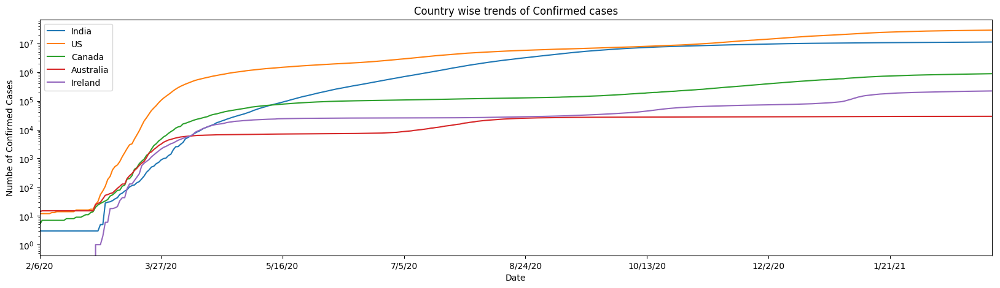

In [0]:
global_confirmed_pds1 = global_confirmed_pds[['Date','India','US','Canada','Australia','Ireland']].iloc[15:,:]
ax = global_confirmed_pds1.set_index('Date').plot(figsize = (20,5), title = 'Country wise trends of Confirmed cases')
plt.ylabel ('Numbe of Confirmed Cases')
ax.set_yscale('log')
display(ax)

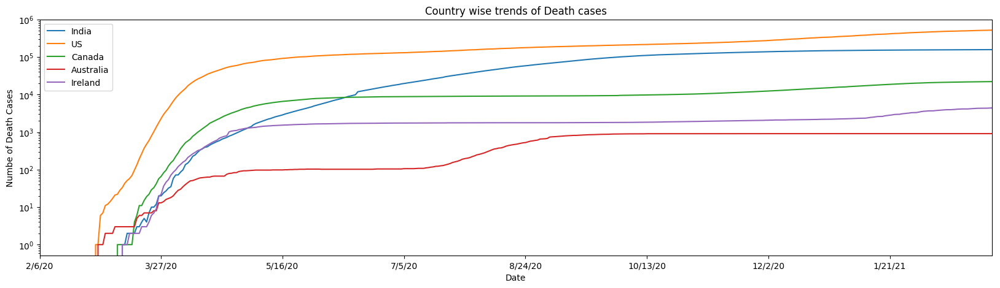

In [0]:
global_deaths_pds1 = global_deaths_pds[['Date','India','US','Canada','Australia','Ireland']].iloc[15:,:]
ax = global_deaths_pds1.set_index('Date').plot(figsize = (20,5), title = 'Country wise trends of Death cases')
plt.ylabel ('Numbe of Death Cases')
ax.set_yscale('log')
display(ax)

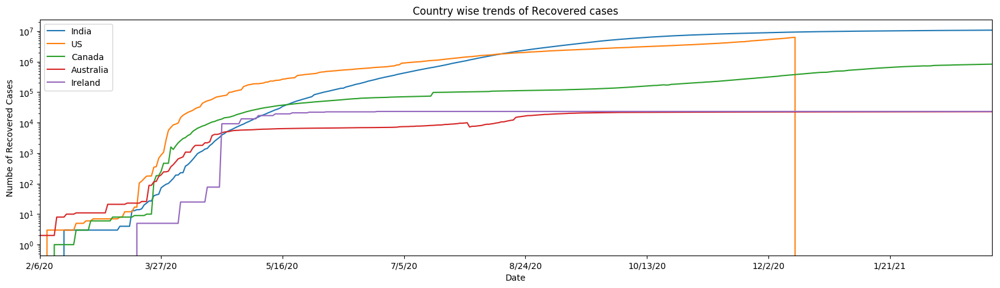

In [0]:
global_recovered_pds1 = global_recovered_pds[['Date','India','US','Canada','Australia','Ireland']].iloc[15:,:]
ax = global_recovered_pds1.set_index('Date').plot(figsize = (20,5), title = 'Country wise trends of Recovered cases')
plt.ylabel ('Numbe of Recovered Cases')
ax.set_yscale('log')
display(ax)

In [0]:
# To compare time series data of different countries, we need to align timeseries data to identical starting point. For this purpose we used a threshold of 100 which is number of infected people.

threshold = 100
compare_confirmed_list=[]
for each in Cntry:
    compare_confirmed_list.append(np.array(global_confirmed_sdf_4[each][global_confirmed_sdf_4[each]>threshold]))

In [0]:
# dataframe of selected countries with number of confirmed cases
global_confirmed_duble = pd.DataFrame(compare_confirmed_list,index=Cntry).T
global_confirmed_duble.head()

,India,US,Australia,Spain,Ireland
0,102.0,107.0,107.0,120.0,129.0
1,113.0,184.0,128.0,165.0,129.0
2,119.0,237.0,128.0,222.0,169.0
3,142.0,403.0,200.0,259.0,223.0
4,156.0,519.0,250.0,400.0,292.0


In [0]:
# dataframe of selected countries with number of deaths
compare_deaths_list=[]
for each in Cntry:
    compare_deaths_list.append(np.array(global_deaths_sdf_4[each][global_deaths_sdf_4[each]>threshold]))

global_deaths_duble = pd.DataFrame(compare_deaths_list,index=Cntry).T
global_deaths_duble.head()

,India,US,Australia,Spain,Ireland
0,136.0,134.0,101.0,133.0,120.0
1,150.0,194.0,101.0,195.0,137.0
2,178.0,266.0,102.0,289.0,158.0
3,226.0,372.0,102.0,342.0,174.0
4,246.0,475.0,102.0,533.0,210.0


In [0]:
# dataframe of selected countries with number of confirmed cases
compare_recovered_list=[]
for each in Cntry:
    compare_recovered_list.append(np.array(global_recovered_sdf_4[each][global_recovered_sdf_4[each]>threshold]))

global_recovered_duble = pd.DataFrame(compare_recovered_list,index=Cntry).T
global_recovered_duble.head()

,India,US,Australia,Spain,Ireland
0,102.0,105.0,115.0,183.0,9233.0
1,123.0,121.0,119.0,183.0,9233.0
2,148.0,147.0,172.0,193.0,9233.0
3,191.0,176.0,194.0,517.0,9233.0
4,192.0,178.0,244.0,517.0,9233.0


In [0]:
# Lets define a helper function to plot the dataframes quickly

def quick_plot(x_in, df_input,main_title,y_title,x_title,y_scale='log',slider=False):
    fig = go.Figure()
    for each in df_input.columns:
        fig.add_trace(go.Scatter(x=x_in,y=df_input[each],name=each))
    fig.update_yaxes(type=y_scale),
    fig.update_layout(title=main_title),
    fig.update_layout(yaxis_title=y_title),
    fig.update_layout(xaxis_title=x_title),
    if slider==True:
        fig.update_layout(xaxis_rangeslider_visible=True)
    fig.show()


In [0]:
# Linear Plot of the confirmed cases for all the selected countries
global_confirmed_duble["Date"] = np.arange(global_confirmed_duble.shape[0])
quick_plot(global_confirmed_duble.Date, global_confirmed_duble.iloc[:,:-1],main_title='Recovered cases country wise',y_title='Recovered cases (source johns hopkins csse)',x_title='Days',y_scale='linear',slider=True)


In [0]:
# Log Plot of the confirmed cases for all the selected countries
global_confirmed_duble["Date"] = np.arange(global_confirmed_duble.shape[0])
quick_plot(global_confirmed_duble.Date, global_confirmed_duble.iloc[:,:-1],main_title='Recovered cases country wise',y_title='Recovered cases (source johns hopkins csse)',x_title='Days',y_scale='log',slider=True)

In [0]:
# Log Plot of the deaths for all the selected countries
global_deaths_duble["Date"] = np.arange(global_deaths_duble.shape[0])
quick_plot(global_deaths_duble.Date, global_deaths_duble.iloc[:,:-1],main_title='Deaths country wise',y_title='Deaths (source johns hopkins csse)',x_title='Days',y_scale='log',slider=True)

In [0]:
# Log Plot of the recovered cases for all the selected countries
global_recovered_duble["Date"] = np.arange(global_recovered_duble.shape[0])
quick_plot(global_recovered_duble.Date, global_recovered_duble.iloc[:,:-1],main_title='Recovered cases country wise',y_title='Recovered cases (source johns hopkins csse)',x_title='Days',y_scale='log',slider=True)

In [0]:
# Here N_0 denotes the base number, t denotes a particular time and T_d denotes the days in which base number doubles.
def doubling_rate(N_0,t,T_d):
    return N_0*np.power(2,t/T_d)

In [0]:
# We are taking a base number of 100
max_days = 15

slope_line = {
    'Doubling every 2 days': doubling_rate(100,np.arange(max_days),2),
    'Doubling every 5 days': doubling_rate(100,np.arange(max_days),5),
    'Doubling every 10 days': doubling_rate(100,np.arange(max_days),10)
}

In [0]:
global_confirmed_duble_w_slope = pd.concat([pd.DataFrame(slope_line),global_confirmed_duble],axis=1)
global_confirmed_duble_w_slope.head()

,Doubling every 2 days,Doubling every 5 days,Doubling every 10 days,India,US,Australia,Spain,Ireland,Date
0,100.000000,100.000000,100.000000,102.0,107.0,107.0,120.0,129.0,0
1,141.421356,114.869835,107.177346,113.0,184.0,128.0,165.0,129.0,1
2,200.000000,131.950791,114.869835,119.0,237.0,128.0,222.0,169.0,2
3,282.842712,151.571657,123.114441,142.0,403.0,200.0,259.0,223.0,3
4,400.000000,174.110113,131.950791,156.0,519.0,250.0,400.0,292.0,4


In [0]:
# Below graph plots the doubling rate line with confirmed cases to see which country is closer to which doubling rate 

quick_plot(global_confirmed_duble_w_slope.Date, 
           global_confirmed_duble_w_slope.iloc[1:20,0:6],
           main_title='Confirmed cases with doubling rate line',
           y_title='Confirmed cases (source johns hopkins csse)',
           x_title='Days',
           y_scale='log',slider=True
           )

In [0]:
# Below graph plots the doubling rate line with deaths to see which country is closer to which doubling rate 

global_deaths_duble_w_slope = pd.concat([pd.DataFrame(slope_line),global_deaths_duble],axis=1)
quick_plot(global_deaths_duble_w_slope.Date, 
           global_deaths_duble_w_slope.iloc[1:20,0:6],
           main_title='Deaths line with doubling rate line',
           y_title='Deaths (source johns hopkins csse)',
           x_title='Days',
           y_scale='log',slider=True
           )

In [0]:
# Below graph plots the doubling rate line with recovered cases to see which country is closer to which doubling rate

global_recovered_duble_w_slope = pd.concat([pd.DataFrame(slope_line),global_recovered_duble],axis=1)
quick_plot(global_recovered_duble_w_slope.Date, 
           global_recovered_duble_w_slope.iloc[1:20,0:6],
           main_title='Recovered line with doubling rate line',
           y_title='Recovered (source johns hopkins csse)',
           x_title='Days',
           y_scale='log',slider=True
           )

In [0]:
# importing libraries for the machine learning
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml import Pipeline

In [0]:
display(global_confirmed_sdf_7.take(5))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,548,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,643,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,920,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2075,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0


In [0]:
# Spliting the date into day, Month and Year part
split_date=pyspark.sql.functions.split(global_confirmed_sdf_7['Date'], '-')
global_confirmed_sdf_7 = global_confirmed_sdf_7.withColumn('Year',split_date.getItem(0).cast('int'))
global_confirmed_sdf_7 = global_confirmed_sdf_7.withColumn('Month',split_date.getItem(1).cast('int'))
global_confirmed_sdf_7 = global_confirmed_sdf_7.withColumn('Day',split_date.getItem(2).cast('int'))
display(global_confirmed_sdf_7.take(5))

Date,Chad,Paraguay,Russia,Yemen,Senegal,Cabo Verde,Sweden,Guyana,Burma,Eritrea,Philippines,Djibouti,Malaysia,Singapore,Fiji,Turkey,Malawi,Iraq,Germany,Comoros,Afghanistan,Cambodia,Jordan,Maldives,Rwanda,Sudan,France,Greece,Kosovo,MS Zaandam,Sri Lanka,Dominica,Algeria,Equatorial Guinea,Togo,Slovakia,Argentina,Angola,Belgium,San Marino,Ecuador,Qatar,Lesotho,Albania,Madagascar,Finland,Ghana,Nicaragua,Benin,Peru,Sierra Leone,Bahamas,China,India,Belarus,Kuwait,Malta,Timor-Leste,Sao Tome and Principe,Marshall Islands,Somalia,Chile,Tajikistan,Croatia,Burundi,Andorra,Bolivia,Nigeria,Gabon,Italy,Suriname,Lithuania,Norway,Spain,Cuba,Mauritania,Czechia,Congo (Kinshasa),Central African Republic,Denmark,Niger,Bangladesh,Barbados,Iran,US,Ireland,Liechtenstein,Laos,Thailand,Bhutan,Monaco,Morocco,Panama,Ukraine,Venezuela,Iceland,Israel,Holy See,Saint Kitts and Nevis,Oman,Taiwan*,Cyprus,Uruguay,Cote d'Ivoire,Mexico,Estonia,Georgia,Montenegro,Zimbabwe,Indonesia,Saint Vincent and the Grenadines,Guatemala,Mongolia,Azerbaijan,Libya,Grenada,Armenia,Liberia,Tunisia,Honduras,Syria,Trinidad and Tobago,Congo (Brazzaville),Saudi Arabia,Uganda,Namibia,Switzerland,Zambia,Ethiopia,Eswatini,Jamaica,Latvia,Brunei,South Sudan,United Arab Emirates,Saint Lucia,Guinea,Canada,Seychelles,Kyrgyzstan,North Macedonia,Samoa,Uzbekistan,Mozambique,"Korea, South",Belize,Brazil,Gambia,Kenya,West Bank and Gaza,Lebanon,Antigua and Barbuda,Slovenia,Dominican Republic,Botswana,Japan,Tanzania,Luxembourg,New Zealand,Bosnia and Herzegovina,Haiti,Poland,Portugal,Australia,Cameroon,Papua New Guinea,Guinea-Bissau,Romania,Bulgaria,Solomon Islands,Austria,Nepal,Costa Rica,Egypt,El Salvador,Kazakhstan,Serbia,Burkina Faso,South Africa,Bahrain,Micronesia,Colombia,Hungary,Pakistan,Vanuatu,Mauritius,Moldova,United Kingdom,Vietnam,Diamond Princess,Mali,Netherlands,Year,Month,Day
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,548,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2020,1,22
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,643,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2020,1,23
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,920,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2020,1,24
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,3,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2020,1,25
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2075,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2020,1,26


In [0]:
# Regression model to apply on a single country. So we have sliced India data for further study
global_confirmed_sdf_ind = global_confirmed_sdf_7.select('Date','India','Year','Month','Day')
global_confirmed_sdf_ind = global_confirmed_sdf_ind.withColumnRenamed('India','India_Confirmed')
display(global_confirmed_sdf_ind.take(5))

Date,India_Confirmed,Year,Month,Day
2020-01-22,0,2020,1,22
2020-01-23,0,2020,1,23
2020-01-24,0,2020,1,24
2020-01-25,0,2020,1,25
2020-01-26,0,2020,1,26


In [0]:
# Schema of the dataframe under study
global_confirmed_sdf_ind.printSchema()

root
-- Date: date (nullable = true)
-- India_Confirmed: long (nullable = true)
-- Year: integer (nullable = true)
-- Month: integer (nullable = true)
-- Day: integer (nullable = true)

In [0]:
# Spliting the date into day, Month and Year part
split_date=pyspark.sql.functions.split(global_deaths_sdf_7['Date'], '-')
global_deaths_sdf_7 = global_deaths_sdf_7.withColumn('Year',split_date.getItem(0).cast('int'))
global_deaths_sdf_7 = global_deaths_sdf_7.withColumn('Month',split_date.getItem(1).cast('int'))
global_deaths_sdf_7 = global_deaths_sdf_7.withColumn('Day',split_date.getItem(2).cast('int'))
global_deaths_sdf_ind = global_deaths_sdf_7.select('Date','India','Year','Month','Day')
global_deaths_sdf_ind = global_deaths_sdf_ind.withColumnRenamed('India','India_Deaths')
display(global_deaths_sdf_ind.take(5))

Date,India_Deaths,Year,Month,Day
2020-01-22,0,2020,1,22
2020-01-23,0,2020,1,23
2020-01-24,0,2020,1,24
2020-01-25,0,2020,1,25
2020-01-26,0,2020,1,26


In [0]:
# Spliting the date into day, Month and Year part
split_date=pyspark.sql.functions.split(global_recovered_sdf_7['Date'], '-')
global_recovered_sdf_7 = global_recovered_sdf_7.withColumn('Year',split_date.getItem(0).cast('int'))
global_recovered_sdf_7 = global_recovered_sdf_7.withColumn('Month',split_date.getItem(1).cast('int'))
global_recovered_sdf_7 = global_recovered_sdf_7.withColumn('Day',split_date.getItem(2).cast('int'))
global_recovered_sdf_ind = global_recovered_sdf_7.select('Date','India','Year','Month','Day')
global_recovered_sdf_ind = global_recovered_sdf_ind.withColumnRenamed('India','India_Recovered')
display(global_recovered_sdf_ind.take(5))

Date,India_Recovered,Year,Month,Day
2020-01-22,0,2020,1,22
2020-01-23,0,2020,1,23
2020-01-24,0,2020,1,24
2020-01-25,0,2020,1,25
2020-01-26,0,2020,1,26


In [0]:
# SQL query to check the spark dataframe
global_deaths_sdf_ind.createOrReplaceTempView('ind_deaths_cases')
sqlContext.sql("select * from ind_deaths_cases where Date = '2020-01-25'").show()

+----------+------------+----+-----+---+
 Date|India_Deaths|Year|Month|Day|
+----------+------------+----+-----+---+
2020-01-25| 0|2020| 1| 25|
+----------+------------+----+-----+---+

In [0]:
# Join of two dataframes to view the confirmed and deaths from US
global_confirmed_deaths_sdf = global_confirmed_sdf_ind.join(global_deaths_sdf_ind,on=["Date"]).select(global_confirmed_sdf_ind.Year,global_confirmed_sdf_ind.Month,global_confirmed_sdf_ind.Day,"India_Confirmed","India_Deaths")
global_confirmed_deaths_sdf.show()

+----+-----+---+---------------+------------+
Year|Month|Day|India_Confirmed|India_Deaths|
+----+-----+---+---------------+------------+
2020| 1| 22| 0| 0|
2020| 1| 23| 0| 0|
2020| 1| 24| 0| 0|
2020| 1| 25| 0| 0|
2020| 1| 26| 0| 0|
2020| 1| 27| 0| 0|
2020| 1| 28| 0| 0|
2020| 1| 29| 0| 0|
2020| 1| 30| 1| 0|
2020| 1| 31| 1| 0|
2020| 2| 1| 1| 0|
2020| 2| 2| 2| 0|
2020| 2| 3| 3| 0|
2020| 2| 4| 3| 0|
2020| 2| 5| 3| 0|
2020| 2| 6| 3| 0|
2020| 2| 7| 3| 0|
2020| 2| 8| 3| 0|
2020| 2| 9| 3| 0|
2020| 2| 10| 3| 0|
+----+-----+---+---------------+------------+
only showing top 20 rows

In [0]:
# Preparing pipeline for the machine Learning

columns_to_use = ['India_Confirmed','India_Deaths']
assembler = VectorAssembler(inputCols = columns_to_use, outputCol = "features")
pipeline = Pipeline(stages=[assembler])
pipeline_model = pipeline.fit(global_confirmed_deaths_sdf)
global_confirmed_deaths_sdf_feature = pipeline_model.transform(global_confirmed_deaths_sdf)
display(global_confirmed_deaths_sdf_feature.take(5))

Year,Month,Day,India_Confirmed,India_Deaths,features
2020,1,22,0,0,"List(0, 2, List(), List())"
2020,1,23,0,0,"List(0, 2, List(), List())"
2020,1,24,0,0,"List(0, 2, List(), List())"
2020,1,25,0,0,"List(0, 2, List(), List())"
2020,1,26,0,0,"List(0, 2, List(), List())"


In [0]:
# Spliting the data into train and test set
(train_sdf, test_sdf) = global_confirmed_deaths_sdf_feature.randomSplit([0.8, 0.2])
from pyspark.ml.regression import LinearRegression
from pyspark.ml.stat import Correlation
lr = LinearRegression(featuresCol='features',labelCol='India_Deaths')
lr_model = lr.fit(train_sdf)

In [0]:
# Model performance based on the data analysed.

trainingSum = lr_model.summary

print("RMSE: %f" % trainingSum.rootMeanSquaredError)
print("r2: %f" % trainingSum.r2)

RMSE: 0.000000
r2: 1.000000

In [0]:
# Printing the predictions
predictions = lr_model.transform(test_sdf)
display(predictions.select('prediction','India_Deaths','features').take(15))

prediction,India_Deaths,features
0.0,0,"List(0, 2, List(), List())"
0.0,0,"List(0, 2, List(), List())"
0.0,0,"List(1, 2, List(), List(3.0, 0.0))"
0.0,0,"List(1, 2, List(), List(3.0, 0.0))"
0.0,0,"List(1, 2, List(), List(3.0, 0.0))"
0.0,0,"List(1, 2, List(), List(3.0, 0.0))"
0.0,0,"List(1, 2, List(), List(3.0, 0.0))"
0.0,0,"List(1, 2, List(), List(3.0, 0.0))"
0.0,0,"List(1, 2, List(), List(34.0, 0.0))"
0.0,0,"List(1, 2, List(), List(39.0, 0.0))"


In [0]:
global_confirmed_pdf_7 = global_confirmed_sdf_7.toPandas()
global_deaths_pdf_7 = global_confirmed_sdf_7.toPandas()
global_recovered_pdf_7 = global_confirmed_sdf_7.toPandas()

In [0]:
from sklearn import linear_model
reg = linear_model.LinearRegression(fit_intercept=False)
l_vec = len(global_confirmed_pdf_7['US'])
X = np.arange(l_vec-5).reshape(-1,1)
y = np.log(np.array(global_confirmed_pdf_7['US'][5:]))

reg.fit(X,y)
X_hat = np.arange(l_vec).reshape(-1,1)
Y_hat = reg.predict(X_hat)

LR_inspect = global_confirmed_pdf_7[['Date','US']].copy()
LR_inspect['prediction'] = np.exp(Y_hat)

quick_plot(LR_inspect.Date,
          LR_inspect.iloc[:,1:],
           main_title='Confirmed cases predictions',
           y_title='Confirmed cases (source johns hopkins csse)',
           x_title='Date',
           y_scale = 'log',
          slider='True')

In [0]:
global_confirmed_deaths_sdf = global_confirmed_sdf_ind.join(global_deaths_sdf_ind,on=["Date"]).select("Date","India_Confirmed","India_Deaths")
display(global_confirmed_deaths_sdf)

Date,India_Confirmed,India_Deaths
2020-01-22,0,0
2020-01-23,0,0
2020-01-24,0,0
2020-01-25,0,0
2020-01-26,0,0
2020-01-27,0,0
2020-01-28,0,0
2020-01-29,0,0
2020-01-30,1,0
2020-01-31,1,0


In [0]:
global_confirmed_deaths_recovered_sdf = global_confirmed_deaths_sdf.join(global_recovered_sdf_ind,on=["Date"]).select("Date","India_Confirmed","India_Deaths","India_Recovered")
display(global_confirmed_deaths_recovered_sdf)

Date,India_Confirmed,India_Deaths,India_Recovered
2020-01-22,0,0,0
2020-01-23,0,0,0
2020-01-24,0,0,0
2020-01-25,0,0,0
2020-01-26,0,0,0
2020-01-27,0,0,0
2020-01-28,0,0,0
2020-01-29,0,0,0
2020-01-30,1,0,0
2020-01-31,1,0,0


In [0]:
columns_to_use = ['India_Confirmed','India_Deaths','India_Recovered']
assembler = VectorAssembler(inputCols = columns_to_use, outputCol = "corr_features")
pipeline = Pipeline(stages=[assembler])

pipeline_model = pipeline.fit(global_confirmed_deaths__recovered_sdf)
corr_feature = pipeline_model.transform(global_confirmed_deaths__recovered_sdf).select('corr_features')
matrix = Correlation.corr(corr_feature,'corr_features').collect()[0][0]
corrmatrix = matrix.toArray().tolist()
print(corrmatrix)
matrix

[[1.0, 0.9973343858235537, 0.9976358301078774], [0.9973343858235537, 1.0, 0.9906137784362529], [0.9976358301078774, 0.9906137784362529, 1.0]]
Out[147]: DenseMatrix(3, 3, [1.0, 0.9973, 0.9976, 0.9973, 1.0, 0.9906, 0.9976, 0.9906, 1.0], False)

In [0]:
global_confirmed_deaths_recovered_pdf = global_confirmed_deaths__recovered_sdf.toPandas()

#global_confirmed_duble["Date"] = np.arange(global_confirmed_duble.shape[0])
quick_plot(global_confirmed_deaths_recovered_pdf.Date, global_confirmed_deaths_recovered_pdf.iloc[:,:],main_title='India Covid cases',y_title='Covid Cases cases (source johns hopkins csse)',x_title='Days',y_scale='linear',slider=True)